# Import Libraries 

In [1]:
import pandas as pd 
import seaborn as sns
import numpy as np 
import matplotlib.pyplot as plt
import plotly.express as px
import math
import missingno as mno 

D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


#  Import data from Desktop 

In [2]:
url_prod = "produccin-de-pozos-de-gas-y-petrleo-no-convencional.csv"
df_prod = pd.read_csv(url_prod)


# Preparation of Dataset 

In [3]:
df_prod.head().T

,0,1,2,3,4
idempresa,YSUR,YSUR,YSUR,YSUR,YSUR
anio,2015,2015,2015,2015,2015
mes,1,1,1,1,1
idpozo,147505,130515,145329,152786,133430
prod_pet,8.52,0.0,0.0,242.14,0.0
prod_gas,153.82,33.24,0.0,2195.54,0.0
prod_agua,14.71,13.37,0.0,49.3,0.0
iny_agua,0.0,0.0,0.0,0.0,0.0
iny_gas,0.0,0.0,0.0,0.0,0.0
iny_co2,0.0,0.0,0.0,0.0,0.0


In [4]:
dict_prod = {
    'idempresa' : 'company_id' , 
    'sigla' : 'well_name',
    'anio' : 'year' , 
    'mes' : 'month' , 
    'idpozo' : 'well_id' ,
    'prod_pet' : 'oil_prod' , 
    'prod_gas' : 'gas_prod' , 
    'prod_agua' : 'water_prod' , 
    'iny_agua' : 'water_inj' , 
    'iny_gas' : 'gas_inj' ,
    'iny_co2' : 'co2_inj',
    'tef' : 'effective_time',
    'tipoextraccion' : 'extraction_type',
    'empresa' : 'company_name',
    'profundidad': 'depth',
    'formacion' : 'formation',
    'cuenca' : 'basin' ,
    'coordenadax' : 'longitude',
    'coordenaday' : 'latitude' , 
    'tipo_de_recurso' : 'ressource_type' ,
    'clasificacion' : 'classification' , 
    'fecha_data' : 'dates'   
}


df_prod = df_prod.rename(columns = dict_prod )
df_prod['dates'] = pd.to_datetime(df_prod['dates'],format='%Y-%m-%d')
df_prod['day'] = df_prod.dates.dt.day
df_prod['month'] = df_prod.dates.dt.month

prod_col= ['dates',"year",'month' , 'day', 'company_name','company_id','well_name', 'well_id', 'formation', 'basin','depth', 'longitude', 'latitude', 'water_inj', 'gas_inj', 'co2_inj',  'effective_time',  'ressource_type', 'classification' , 'extraction_type','oil_prod', 'gas_prod', 'water_prod' ]
df_prod = df_prod[prod_col]

df_prod.head(3).T

,0,1,2
dates,2015-01-31 00:00:00,2015-01-31 00:00:00,2015-01-31 00:00:00
year,2015,2015,2015
month,1,1,1
day,31,31,31
company_name,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR ENERGÍA ARGENTINA S.R.L.
company_id,YSUR,YSUR,YSUR
well_name,APA.Nq.RCo-1053(d),AEA.NQ.ACO-5,APA.Nq.CorS.x-1
well_id,147505,130515,145329
formation,precuyo,precuyo,vaca muerta
basin,NEUQUINA,NEUQUINA,NEUQUINA


In [5]:
df_prod.shape

(227221, 23)

In [6]:
print(df_prod["basin"].value_counts().sort_values(ascending =False).head(10))
print('-'*55)
print(df_prod["company_id"].value_counts().sort_values(ascending =False).head(10))
print('-'*55)
print(df_prod["formation"].value_counts().sort_values(ascending =False).head(10))
print('-'*55)
print(df_prod["well_name"].value_counts().sort_values(ascending =False).head(10))
print('-'*55)
print(df_prod["well_id"].value_counts().sort_values(ascending =False).head(10))

NEUQUINA           219760
AUSTRAL              7244
GOLFO SAN JORGE       137
NOROESTE               80
Name: basin, dtype: int64
-------------------------------------------------------
YPF     128620
APS      13139
PLU      11813
TAU       8751
YSUR      7721
PAL       7438
CGC       6886
PBE       6595
APEA      6448
TPT       6150
Name: company_id, dtype: int64
-------------------------------------------------------
vaca muerta     100234
lajas            49706
mulichinco       22582
los molles       17881
precuyo          10796
quintuco          7149
magallanes        6948
punta rosada      5035
agrio             2238
basamento         1430
Name: formation, dtype: int64
-------------------------------------------------------
YPF.Nq.RN.xp-58      576
YPF.Nq.CuM.a-8       400
YPF.Nq.CuM.a-16      400
YPF.Nq.CuM.e-5(I)    400
YPF.Nq.CuM.a-3       398
YPF.Nq.LLL-147       368
YPF.Nq.NG-66         362
YPF.Nq.LLL-479       352
YPF.Nq.LGus.x-1      344
YPF.Nq.LLL.x-475     343
Name: well_

##  We are going to study the vaca muerta (we have a lot of data about this formation)

In [7]:
df_vac = df_prod[(df_prod["basin"]=="NEUQUINA")&(df_prod["formation"]=="vaca muerta")]
df_vac.head()

,dates,year,month,day,company_name,company_id,well_name,well_id,formation,basin,...,water_inj,gas_inj,co2_inj,effective_time,ressource_type,classification,extraction_type,oil_prod,gas_prod,water_prod
2,2015-01-31,2015,1,31,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR,APA.Nq.CorS.x-1,145329,vaca muerta,NEUQUINA,...,0.0,0.0,0.0,0.0,NO CONVENCIONAL,EXPLORACION,Sin Sistema de Extracción,0.0,0.0,0.0
110,2015-01-31,2015,1,31,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR,APA.Nq.Hua.x-1,145330,vaca muerta,NEUQUINA,...,0.0,0.0,0.0,0.0,NO CONVENCIONAL,EXPLORACION,Sin Sistema de Extracción,0.0,0.0,0.0
197,2016-01-31,2016,1,31,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR,APA.Nq.CorS.x-1,145329,vaca muerta,NEUQUINA,...,0.0,0.0,0.0,0.0,NO CONVENCIONAL,EXPLORACION,Sin Sistema de Extracción,0.0,0.0,0.0
225,2016-01-31,2016,1,31,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR,APA.Nq.Hua.x-1,145330,vaca muerta,NEUQUINA,...,0.0,0.0,0.0,0.0,NO CONVENCIONAL,EXPLORACION,Sin Sistema de Extracción,0.0,0.0,0.0
457,2017-01-31,2017,1,31,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR,APA.Nq.CorS.x-1,145329,vaca muerta,NEUQUINA,...,0.0,0.0,0.0,0.0,NO CONVENCIONAL,EXPLORACION,Sin Sistema de Extracción,0.0,0.0,0.0


In [8]:
df_vac.shape

(100234, 23)

In [9]:
print(f"theres's {df_vac['well_name'].nunique()} well ")

theres's 1716 well 


In [10]:
df_vac['well_name'].value_counts().sort_values(ascending = False).head(20)

YPF.Nq.PSNo.x-2      200
YPF.Nq.BP.a-7        200
YPF.Nq.MDM-2         200
YPF.Nq.BP.x-2        200
PC.Nq.BMo-1001       200
PPC.Nq.EC-4          199
YPF.Nq.FP.x-2        199
YPF.Nq.MMo.x-1       196
YPF.Nq.Corr.x-1      193
APS.Nq.ADC.x-1010    182
YPF.Nq.LLLK.x-1      178
TAU.Nq.SR.xp-1001    174
YPF.Nq.LLL-479       174
YPF.Nq.LLL.x-475     171
YPF.Nq.SOil.x-1      171
YPF.Nq.LLL.x-485     169
YPF.Nq.LLL-147       168
YPF.Nq.LGus.x-1      167
YPF.Nq.LLL-530h      166
YPF.Nq.LGus.x-2      166
Name: well_name, dtype: int64

### Missing Values 

In [11]:
df_vac.isnull().sum().sort_values(ascending = False )/df_vac.shape[0]*100

extraction_type    0.137678
dates              0.000000
latitude           0.000000
gas_prod           0.000000
oil_prod           0.000000
classification     0.000000
ressource_type     0.000000
effective_time     0.000000
co2_inj            0.000000
gas_inj            0.000000
water_inj          0.000000
longitude          0.000000
year               0.000000
depth              0.000000
basin              0.000000
formation          0.000000
well_id            0.000000
well_name          0.000000
company_id         0.000000
company_name       0.000000
day                0.000000
month              0.000000
water_prod         0.000000
dtype: float64

In [12]:
#we will delete rows with umpty values in Class and Extraction type because they aren't too much and will increase the error learning
df_vac = df_vac.dropna(axis= 'index' , how = 'any' , subset=['extraction_type'])
df_vac.shape


(100096, 23)

In [13]:
GVF = lambda oilprod,gazprod,waterprod :  gazprod/(oilprod +gazprod+waterprod)*100
GOR = lambda oilprod,gazprod,waterprod :  gazprod/(oilprod +gazprod)*100
GLR = lambda oilprod,gazprod,waterprod :  gazprod/(oilprod + waterprod) 

for i ,j in zip (['GVF%', 'GOR%','GLR' ] , [GVF , GOR,GLR]): 
    df_vac[i] = j(df_vac['oil_prod'] ,df_vac['gas_prod'] , df_vac['water_prod'] )
    df_vac[i] =df_vac[i].fillna(0)
    df_vac[i] =  df_vac[i].round(decimals = 2)
    df_vac[i] = df_vac[i].replace( np.inf , 0  )


    
df_vac.head().T

,2,110,197,225,457
dates,2015-01-31 00:00:00,2015-01-31 00:00:00,2016-01-31 00:00:00,2016-01-31 00:00:00,2017-01-31 00:00:00
year,2015,2015,2016,2016,2017
month,1,1,1,1,1
day,31,31,31,31,31
company_name,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR ENERGÍA ARGENTINA S.R.L.,YSUR ENERGÍA ARGENTINA S.R.L.
company_id,YSUR,YSUR,YSUR,YSUR,YSUR
well_name,APA.Nq.CorS.x-1,APA.Nq.Hua.x-1,APA.Nq.CorS.x-1,APA.Nq.Hua.x-1,APA.Nq.CorS.x-1
well_id,145329,145330,145329,145330,145329
formation,vaca muerta,vaca muerta,vaca muerta,vaca muerta,vaca muerta
basin,NEUQUINA,NEUQUINA,NEUQUINA,NEUQUINA,NEUQUINA


In [14]:
df_vac = df_vac.drop(df_vac[df_vac["GVF%"] ==0].index)

In [15]:
df_vac.shape

(78214, 26)

   ## Discovring Numerical Data 

In [16]:
numerical = [i for i in df_vac.columns if df_vac[i].dtype != 'O' ]
df_vac[numerical].head(5)

,dates,year,month,day,well_id,depth,longitude,latitude,water_inj,gas_inj,co2_inj,effective_time,oil_prod,gas_prod,water_prod,GVF%,GOR%,GLR
8183,2011-01-31,2011,1,31,135147,3072.0,-68.798926,-38.302823,0.0,0.0,0.0,30.46,486.05,191.84,63.75,25.87,28.30,0.35
8226,2012-01-31,2012,1,31,135147,3072.0,-68.798926,-38.302823,0.0,0.0,0.0,20.04,90.89,40.98,5.51,29.83,31.08,0.43
8228,2012-01-31,2012,1,31,135480,3246.0,-68.869028,-38.298751,0.0,0.0,0.0,21.40,99.21,34.07,10.85,23.64,25.56,0.31
8229,2012-01-31,2012,1,31,135484,3165.0,-68.631429,-38.357228,0.0,0.0,0.0,31.00,276.67,47.82,105.17,11.13,14.74,0.13
8230,2012-01-31,2012,1,31,135803,2800.0,-68.788900,-38.456500,0.0,0.0,0.0,30.85,215.69,113.66,14.33,33.07,34.51,0.49


In [17]:
df_vac.describe()

,year,month,day,well_id,depth,longitude,latitude,water_inj,gas_inj,co2_inj,effective_time,oil_prod,gas_prod,water_prod,GVF%,GOR%,GLR
count,78214.000000,78214.000000,78214.000000,78214.000000,78214.000000,78214.000000,78214.000000,78214.0,78214.000000,78214.0,78214.000000,78214.000000,78214.000000,78214.000000,78214.000000,78214.000000,78214.000000
mean,2018.655573,6.453282,30.445687,152249.245800,3899.448189,-68.838602,-38.297130,0.0,6.697903,0.0,27.896910,511.409582,771.084431,263.221914,35.359870,43.060865,2.835024
std,2.537279,3.395139,0.813396,14035.804765,1138.744181,0.228286,0.229292,0.0,1100.405529,0.0,5.852097,1039.558182,2050.648974,635.042940,28.352844,31.968801,63.914718
min,2006.000000,1.000000,28.000000,3640.000000,0.000000,-69.805313,-39.358320,0.0,0.000000,0.0,0.000000,0.000000,0.001250,0.000000,0.010000,0.010000,0.000000
25%,2017.000000,4.000000,30.000000,147292.000000,3060.000000,-68.920172,-38.358876,0.0,0.000000,0.0,28.060625,26.982500,26.920000,6.390000,11.922500,14.250000,0.130000
50%,2019.000000,6.000000,31.000000,154908.000000,3202.000000,-68.869486,-38.330964,0.0,0.000000,0.0,30.000000,92.855000,76.620000,35.900000,25.910000,35.110000,0.340000
75%,2021.000000,9.000000,31.000000,159045.000000,4861.000000,-68.655341,-38.301652,0.0,0.000000,0.0,30.990000,467.992500,321.024685,208.001425,52.287500,65.490000,1.040000
max,2022.000000,12.000000,31.000000,163546.000000,7330.000000,-68.199672,-34.669110,0.0,219701.660000,0.0,79.340000,16513.300000,29129.660000,12316.250000,100.000000,100.000000,13627.000000


In [18]:
#we will delete co2_inj feature because it's doesn't varie
df_vac = df_vac.drop('co2_inj' , axis = 1)
df_vac.shape

(78214, 25)

In [24]:
month_prod = df_vac.groupby(['year','month' ])
month_prod = month_prod[['oil_prod','gas_prod','water_prod']].sum()
#month_prod  = month_prod .set_index('dates')
month_prod.head()

oil_prod  gas_prod  water_prod
year month                                
2006 1       166.583    16.384       9.013
     2       152.826    13.954       6.096
     3       190.628    18.104      41.146
     4       231.068    19.627      55.212
     5       214.604    19.016      61.008

In [34]:
month_inj = df_vac.groupby(['year','month'])
month_inj = month_inj['gas_inj'].sum()
#month_prod  = month_prod .set_index('dates')


In [26]:
month_efftime = df_vac.groupby(['year','month' ])
month_efftime = month_efftime[['effective_time']].mean()
#month_prod  = month_prod .set_index('dates')
month_efftime.head()

effective_time
year month                
2006 1           31.000000
     2           28.000000
     3           20.708335
     4           30.000000
     5           30.958335

Text(0.5, 1.0, 'Monthly effective time 2006 -2020 ')

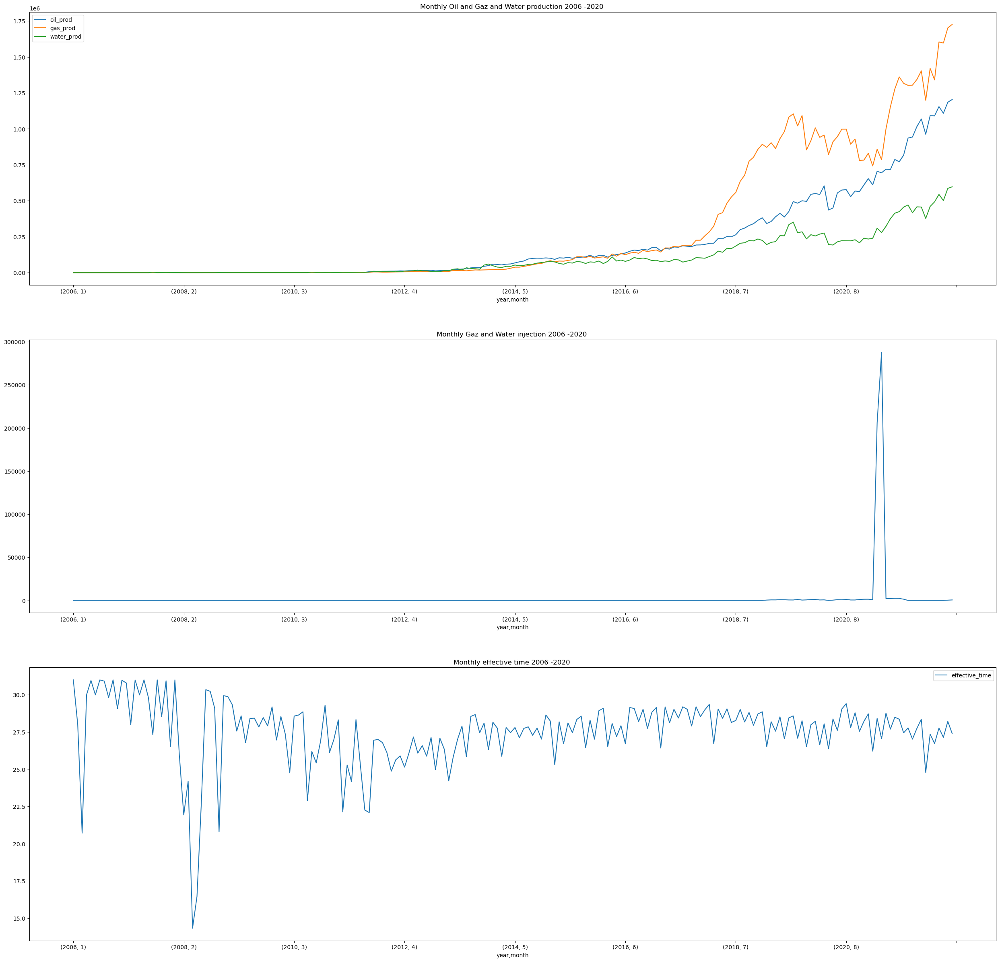

In [35]:
fig,(ax1,ax2,ax3) = plt.subplots(3,1,figsize=(31,30))

ax1 = month_prod.plot(ax=ax1)
ax1.set_title('Monthly Oil and Gaz and Water production 2006 -2020 ')

ax2 = month_inj.plot(ax=ax2)
ax2.set_title('Monthly Gaz and Water injection 2006 -2020 ')

ax3 = month_efftime.plot(ax=ax3)
ax3.set_title('Monthly effective time 2006 -2020 ')




In [36]:
df_vac = df_vac.drop(['gas_inj' , 'water_inj'] , axis = 1)
df_vac.shape

(78214, 23)

Text(0.5, 1.0, 'Monthly effective time 2006 -2020 ')

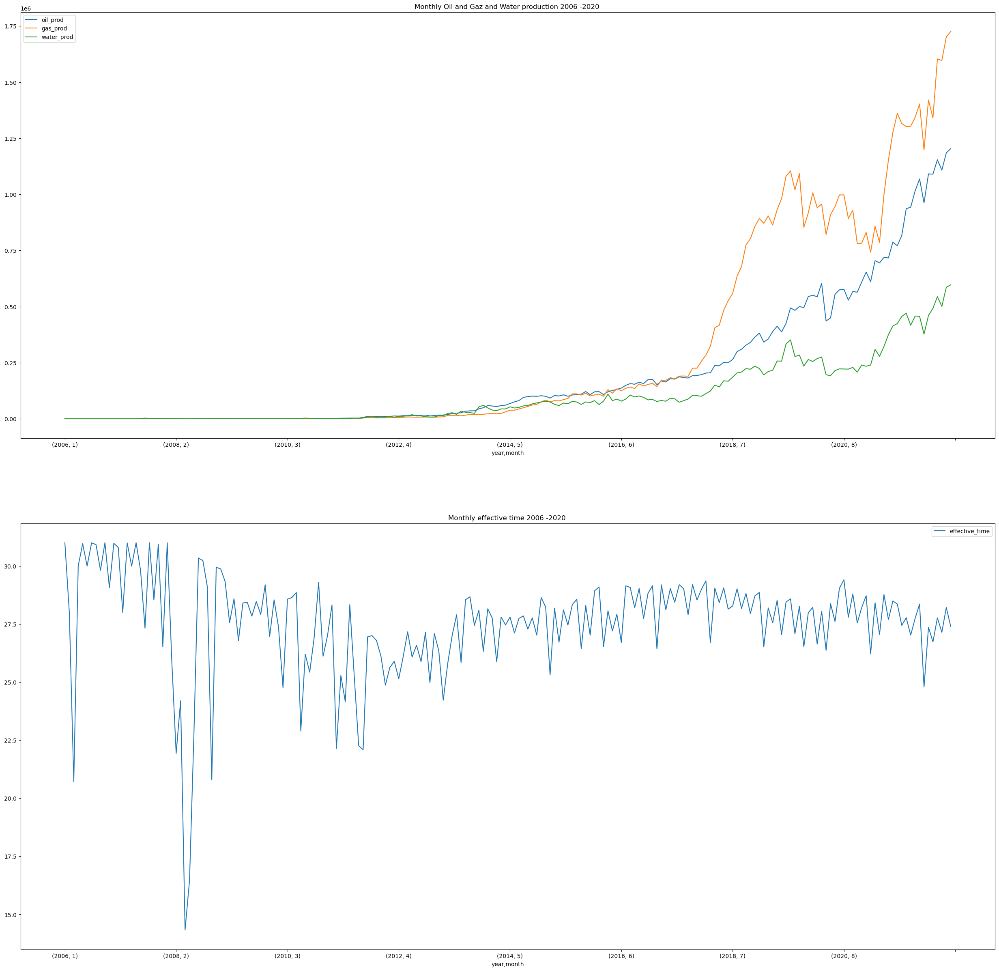

In [37]:
month_prod = df_vac.groupby(['year','month' ])
month_prod = month_prod[['oil_prod','gas_prod','water_prod']].sum()
#month_prod  = month_prod .set_index('dates')
month_prod.head()
month_efftime = df_vac.groupby(['year','month' ])
month_efftime = month_efftime[['effective_time']].mean()
#month_prod  = month_prod .set_index('dates')
month_efftime.head()


fig,(ax1,ax3) = plt.subplots(2,1,figsize=(31,30))

ax1 = month_prod.plot(ax=ax1)
ax1.set_title('Monthly Oil and Gaz and Water production 2006 -2020 ')

ax3 = month_efftime.plot(ax=ax3)
ax3.set_title('Monthly effective time 2006 -2020 ')



In [86]:
well_prod = df_vac.groupby(['well_name'])
well_prod_oil = well_prod[['oil_prod','gas_prod']].sum().sort_values(by='oil_prod', ascending =False)
well_prod_gas = well_prod[['oil_prod','gas_prod']].sum().sort_values(by='gas_prod', ascending =False)
well_prod_gas.head(5)

,oil_prod,gas_prod
well_name,,
TPT.Nq.FP-1241(h),9666.44604,460066.5290
TPT.Nq.FP-1243(h),8979.37719,429362.8105
TPT.Nq.FP-1242(h),7913.68467,379112.2296
TPT.Nq.FP-1111(h),15549.50318,368021.6400
YPF.Nq.EOr-73(h),65.71000,359272.8000


In [93]:
df_vac[df_vac['well_name']=='TPT.Nq.FP-1241(h)'].groupby('month')['GVF%'].mean()

month
1     94.655000
2     90.986667
3     83.942500
4     89.502500
5     90.540000
6     91.632500
7     91.747500
8     92.145000
9     92.750000
10    93.476667
11    94.010000
12    94.440000
Name: GVF%, dtype: float64

Text(0.5, 1.0, 'GVF evolution des puit les productif de gas')

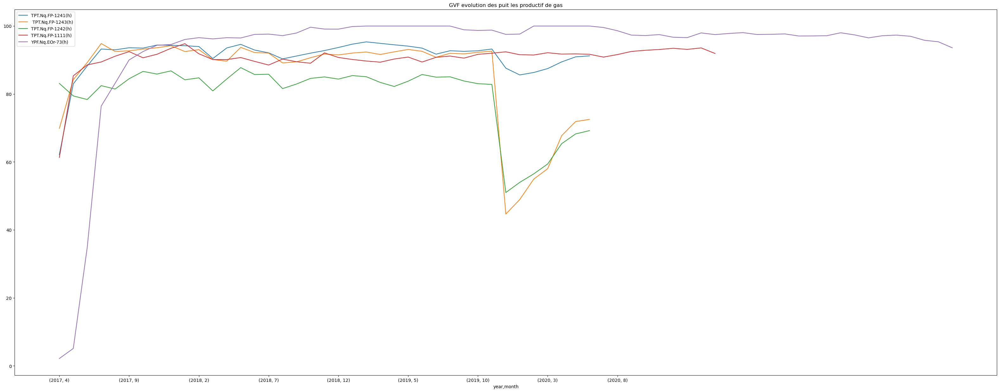

In [107]:

fig,ax1 = plt.subplots(figsize=(40,15))

for i in well_prod_gas.head(5).index:
    a = df_vac[df_vac['well_name']==i].groupby(['year','month'])['GVF%'].mean()
    ax1 = a.plot(ax=ax1 , label =i)
    ax1.legend()


ax1.set_title('GVF evolution des puit les productif de gas')


Text(0.5, 1.0, 'GVF evolution des puit les productif huil')

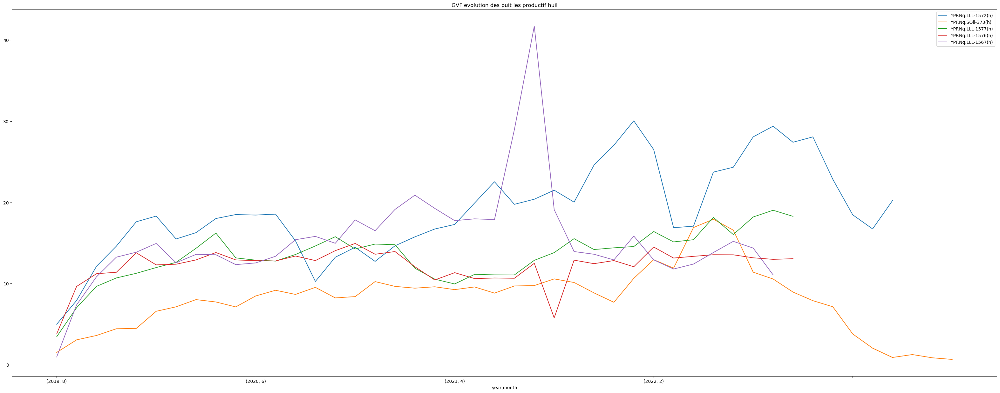

In [109]:
fig,ax1 = plt.subplots(figsize=(40,15))

for i in well_prod_oil.head(5).index:
    a = df_vac[df_vac['well_name']==i].groupby(['year','month'])['GVF%'].mean()
    ax1 = a.plot(ax=ax1 , label =i)
    ax1.legend()


ax1.set_title('GVF evolution des puit les productif huil')


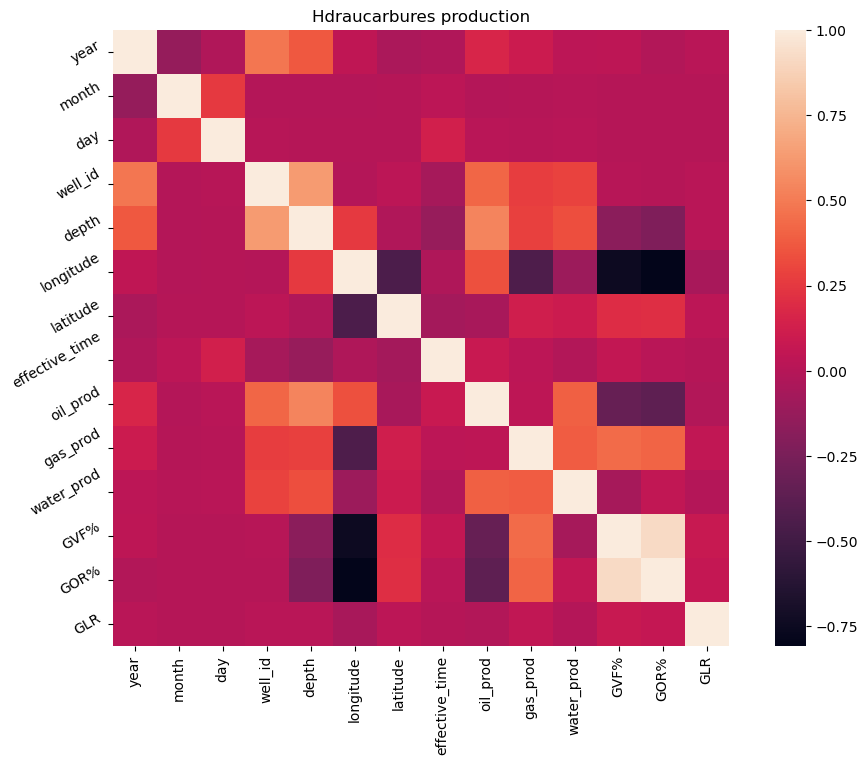

In [27]:
correlation = df_vac.corr()
plt.figure(figsize=(12,8))
plt.title('Hdraucarbures production')
ax = sns.heatmap(correlation, square=True, linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)           
plt.show()

In [28]:
correlation

,year,month,day,well_id,depth,longitude,latitude,effective_time,oil_prod,gas_prod,water_prod,GVF%,GOR%,GLR
year,1.000000,-0.134603,-0.020940,0.481414,0.365663,0.045731,-0.043331,-0.021415,0.164108,0.101352,0.028577,0.039370,-0.010765,0.014081
month,-0.134603,1.000000,0.251332,-0.009368,-0.004727,-0.003141,0.000052,0.028547,-0.007829,0.002022,0.007689,-0.002643,0.003533,0.003097
day,-0.020940,0.251332,1.000000,0.004087,0.003577,-0.001482,0.000969,0.130319,0.013202,0.010164,0.017345,-0.001293,-0.000739,0.002888
well_id,0.481414,-0.009368,0.004087,1.000000,0.629630,-0.008972,0.027184,-0.060192,0.416958,0.265856,0.291906,0.010297,0.002345,0.015667
depth,0.365663,-0.004727,0.003577,0.629630,1.000000,0.254739,-0.022413,-0.128640,0.537240,0.282943,0.330992,-0.177195,-0.222770,0.015573
longitude,0.045731,-0.003141,-0.001482,-0.008972,0.254739,1.000000,-0.446699,-0.027683,0.340047,-0.439996,-0.108856,-0.745072,-0.808197,-0.059314
latitude,-0.043331,0.000052,0.000969,0.027184,-0.022413,-0.446699,1.000000,-0.069994,-0.055752,0.123288,0.101197,0.199111,0.205169,0.030867
effective_time,-0.021415,0.028547,0.130319,-0.060192,-0.128640,-0.027683,-0.069994,1.000000,0.084191,0.029829,-0.012976,0.055454,0.016889,0.001636
oil_prod,0.164108,-0.007829,0.013202,0.416958,0.537240,0.340047,-0.055752,0.084191,1.000000,0.033887,0.397900,-0.328562,-0.367584,-0.015011
gas_prod,0.101352,0.002022,0.010164,0.265856,0.282943,-0.439996,0.123288,0.029829,0.033887,1.000000,0.379182,0.435838,0.410722,0.049946


###  Distribution for Oil production

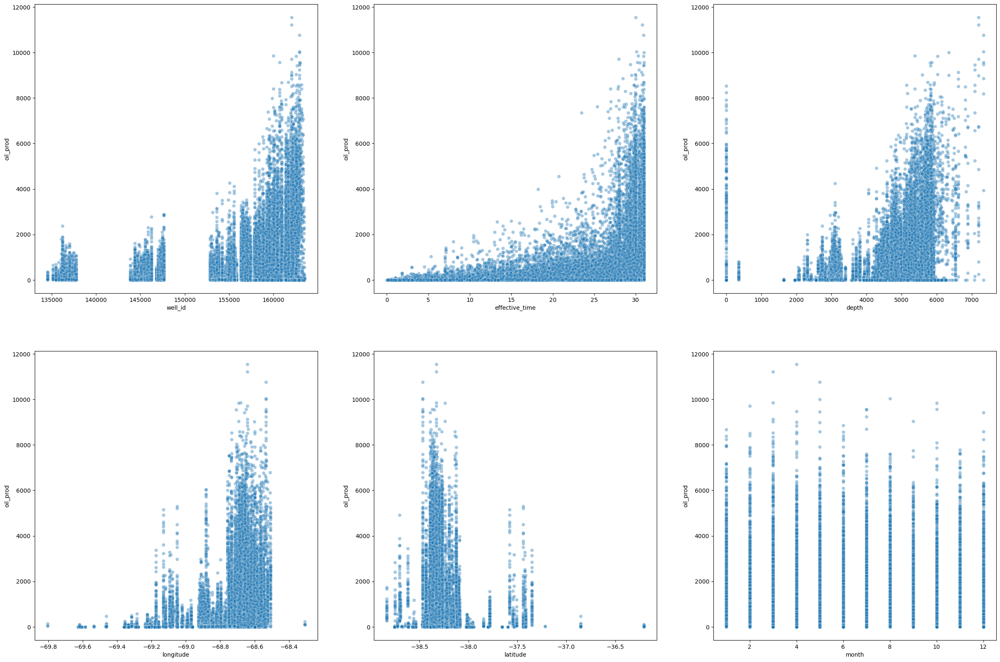

In [29]:

x = ['well_id' , 'effective_time','depth','longitude','latitude','month']
y1 = 'oil_prod'
y2 = 'gas_prod'
y3 = 'water_prod'

plot , ax = plt.subplots(2,3 , figsize = (30 , 20))
for index in range(len(x)):
    sns.scatterplot(data = df_vac , y = y1 , x = x[index] , alpha=0.4 , ax = ax[math.floor(index/3)][index%3])
plt.show()



###  Distribution for Gaz production

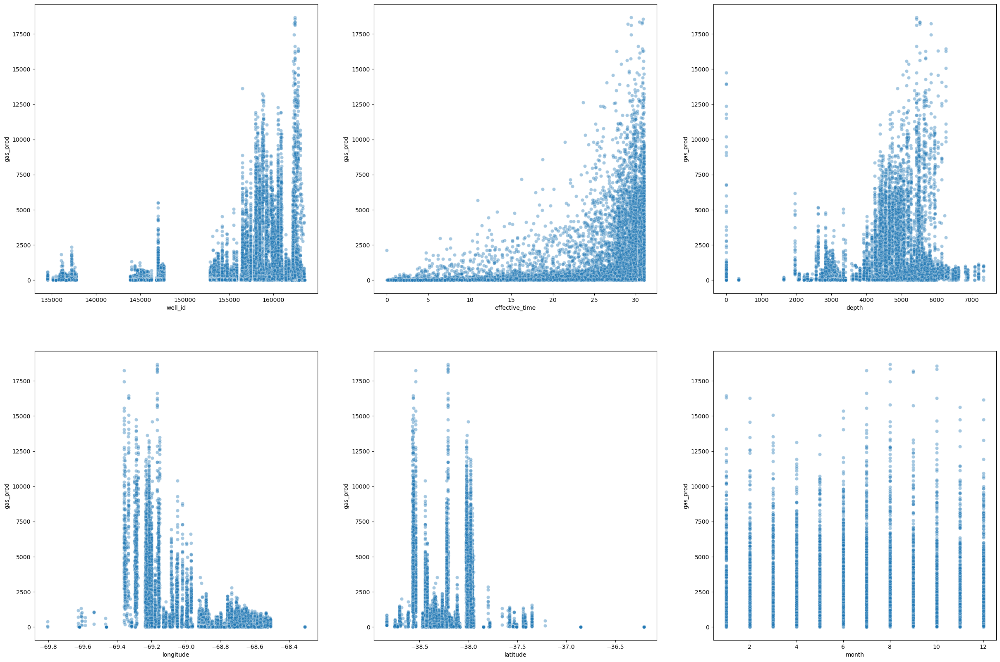

In [30]:
plot , ax = plt.subplots(2,3 , figsize = (30 , 20))
for index in range(len(x)):
    sns.scatterplot(data = df_vac , y = y2 , x = x[index] , alpha=0.4 , ax = ax[math.floor(index/3)][index%3])
plt.show()

###  Distribution for GVF

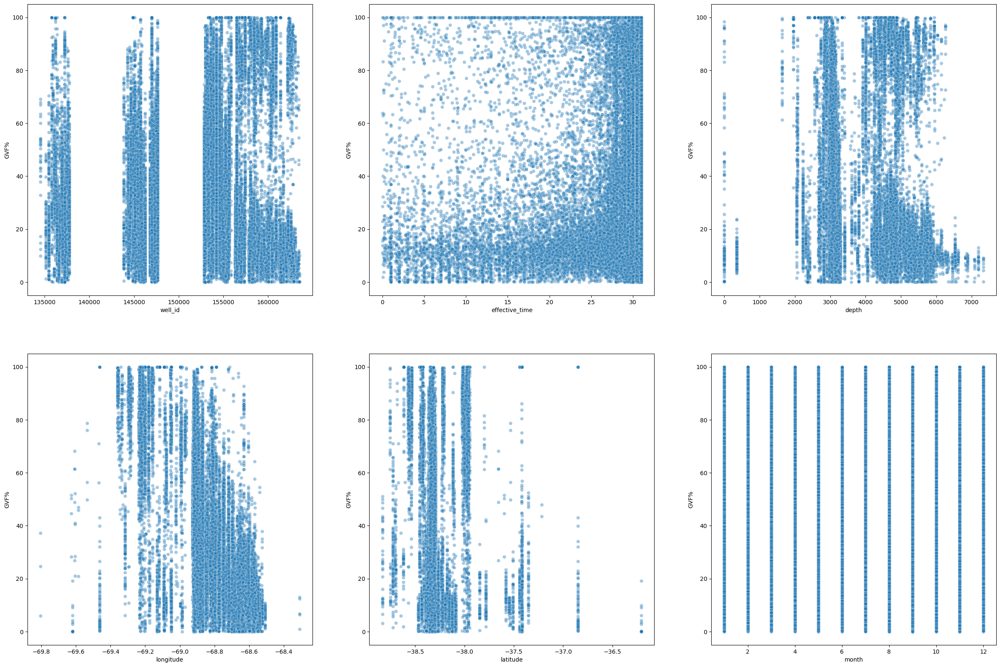

In [31]:

x = ['well_id' , 'effective_time','depth','longitude','latitude','month']
y1 = 'GVF%'
y2 = 'GOR%'
y3 = 'GLR'

plot , ax = plt.subplots(2,3 , figsize = (30 , 20))
for index in range(len(x)):
    sns.scatterplot(data = df_vac , y = y1 , x = x[index] , alpha=0.4 , ax = ax[math.floor(index/3)][index%3])
plt.show()

###  Distribution for GVF

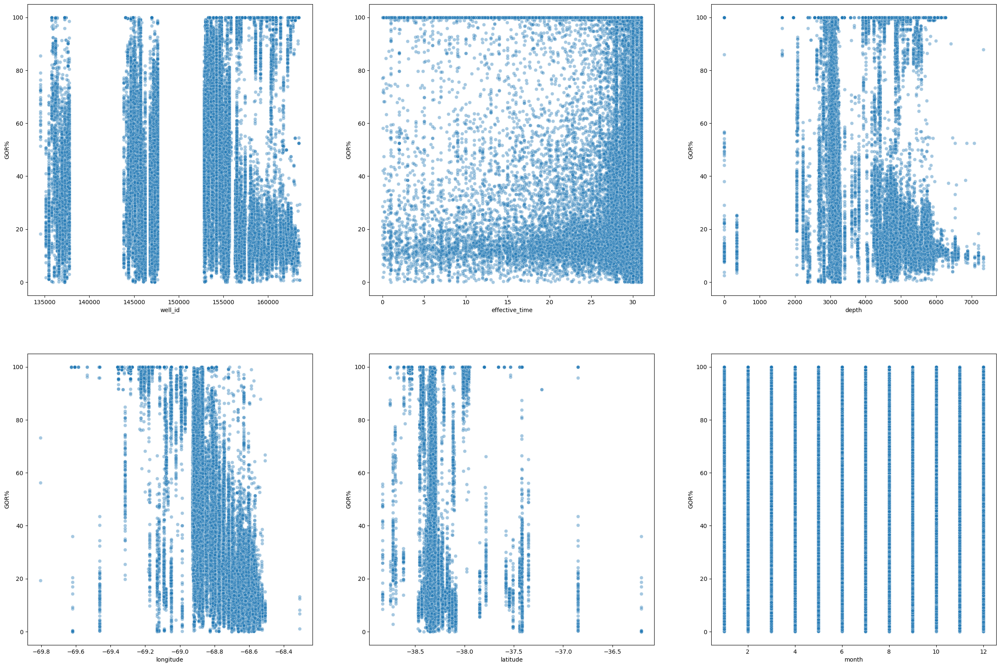

In [32]:
plot , ax = plt.subplots(2,3 , figsize = (30 , 20))
for index in range(len(x)):
    sns.scatterplot(data = df_vac , y = y2 , x = x[index] , alpha=0.4 , ax = ax[math.floor(index/3)][index%3])
plt.show()

##  Detecting Outliers 

Text(0, 0.5, 'effective_time')

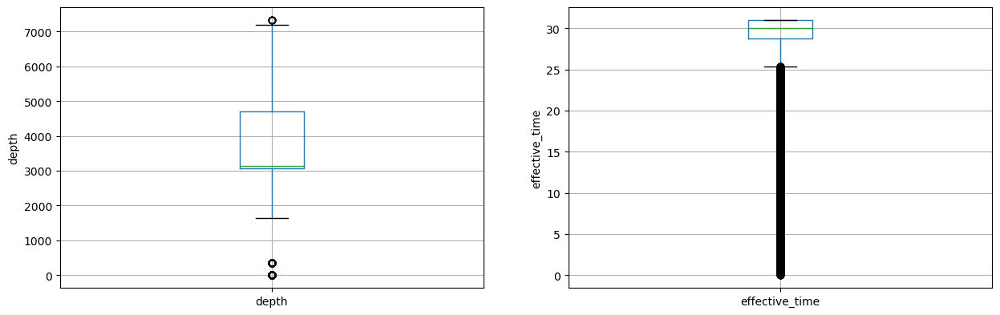

In [33]:
# draw boxplots to visualize outliers

plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = df_vac.boxplot(column='depth')
fig.set_title('')
fig.set_ylabel('depth')


plt.subplot(2, 2, 2)
fig = df_vac.boxplot(column='effective_time')
fig.set_title('')
fig.set_ylabel('effective_time')



In [34]:
print(f"there's {df_vac['depth'][(df_vac['depth']>7000)|(df_vac['depth']<1000)].nunique()} outliers from depth ")
print(f"there's {df_vac['effective_time'][df_vac['effective_time']>32].nunique()} outliers from effective_time")

there's 6 outliers from depth 
there's 0 outliers from effective_time


In [35]:
df_vac = df_vac.drop(df_vac['depth'][(df_vac['depth']>7000)|(df_vac['depth']<1000)].index)
df_vac = df_vac.drop(df_vac['effective_time'][df_vac['effective_time']>32].index)

Text(0, 0.5, 'effective_time')

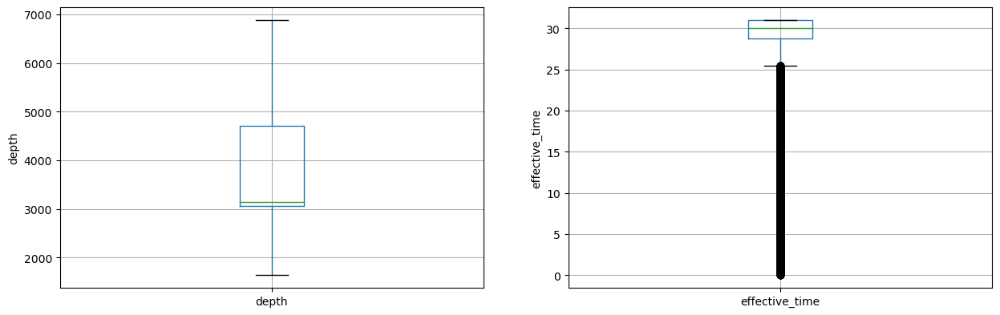

In [36]:
# draw boxplots to visualize outliers

plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = df_vac.boxplot(column='depth')
fig.set_title('')
fig.set_ylabel('depth')


plt.subplot(2, 2, 2)
fig = df_vac.boxplot(column='effective_time')
fig.set_title('')
fig.set_ylabel('effective_time')


###  GVF analysis

In [37]:
df_gvf = df_vac[['GVF%' ,'GLR','GOR%', 'well_name','gas_prod','oil_prod','water_prod']]
gvf_grp = df_gvf.groupby('well_name').agg('mean')
gvf_grp1 = gvf_grp.sort_values(by = 'GVF%' , ascending = False )
gvf_grp2 = gvf_grp.sort_values(by = 'GOR%' , ascending = False )
gvf_grp2

,GVF%,GLR,GOR%,gas_prod,oil_prod,water_prod
well_name,,,,,,
YPF.Nq.EOr-80(h),85.917027,1.515676,100.000000,463.626486,0.000000,274.725405
YPF.Nq.EOr-81(h),87.158913,3.522609,100.000000,886.899348,0.000000,301.063696
YPF.Nq.EOr-76(h)(I),90.728605,19.619767,100.000000,2644.563023,0.000000,241.751163
YPF.Nq.EOr-75(h),84.403571,7.118571,100.000000,1969.928810,0.000000,373.385000
YPF.Nq.EOr-71(h),93.740794,75.563492,100.000000,3580.851746,0.000000,254.750317
...,...,...,...,...,...,...
YPF.Nq.LACh-110(h),2.300000,0.020000,6.240000,11.960000,179.810000,328.760000
YPF.Nq.AdCh-1001(h),4.516667,0.046667,4.797778,237.336667,4822.906667,374.175556
YPF.Nq.AdCh-1002(h),4.261111,0.044444,4.477778,235.286667,5046.753333,319.413333


# GVF distribution 

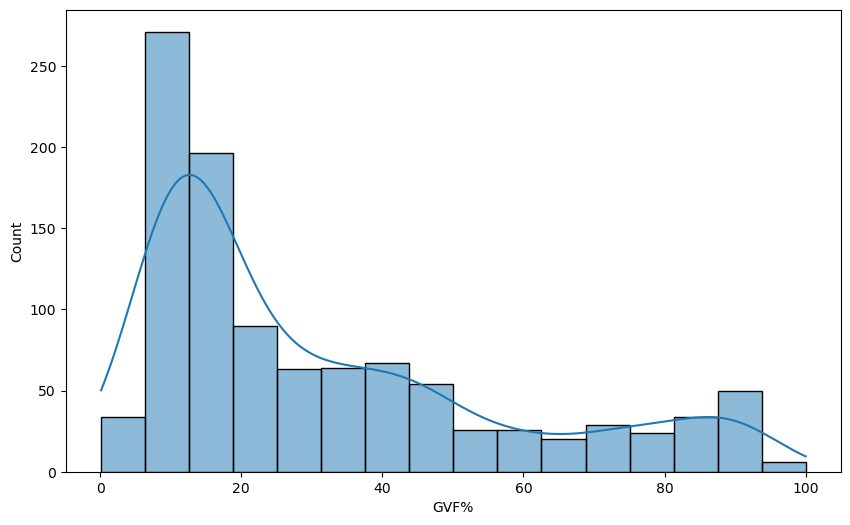

In [38]:
plt.figure(figsize= (10 , 6))
g = sns.histplot(gvf_grp2['GVF%'] , kde = True)

In [39]:
print('SalePrice Skewness is = ' , gvf_grp2['GVF%'].skew())
print("Kurtosis: %f" % gvf_grp2['GVF%'].kurt())

SalePrice Skewness is =  1.0793573809832404
Kurtosis: -0.014314


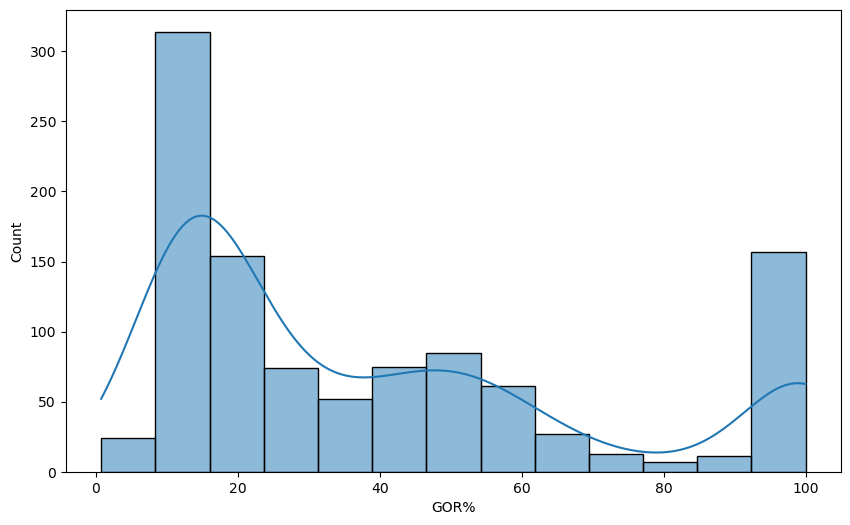

In [40]:
plt.figure(figsize= (10 , 6))
g = sns.histplot(gvf_grp2['GOR%'] , kde = True)

In [41]:
print('SalePrice Skewness is = ' , gvf_grp2['GOR%'].skew())
print("Kurtosis: %f" % gvf_grp2['GOR%'].kurt())

SalePrice Skewness is =  0.9060285233451704
Kurtosis: -0.520248


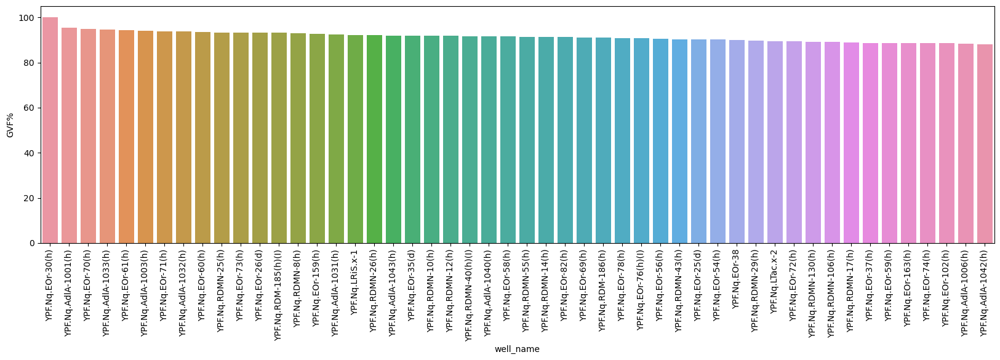

In [42]:
plt.figure(figsize = (20,5))
plt.xticks(rotation='90')
ax = sns.barplot(x = gvf_grp1.head(50).index , y =gvf_grp1['GVF%'].head(50)  )

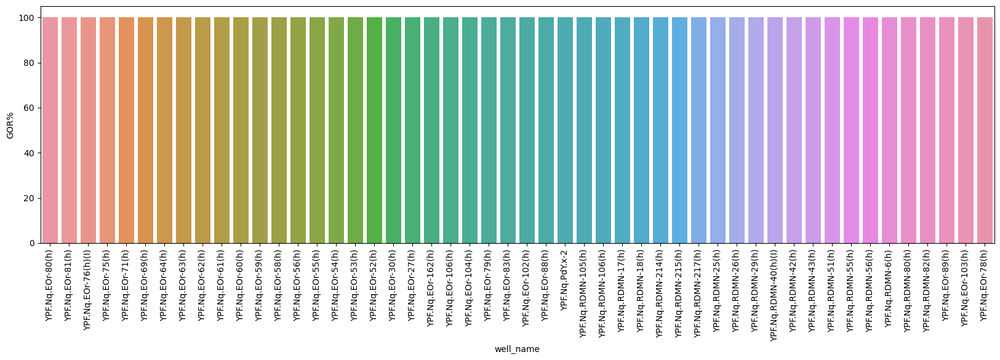

In [43]:
plt.figure(figsize = (20,5))
plt.xticks(rotation='90')
ax = sns.barplot(x = gvf_grp2.head(50).index , y =gvf_grp2['GOR%'].head(50)  )

###  Production distribution

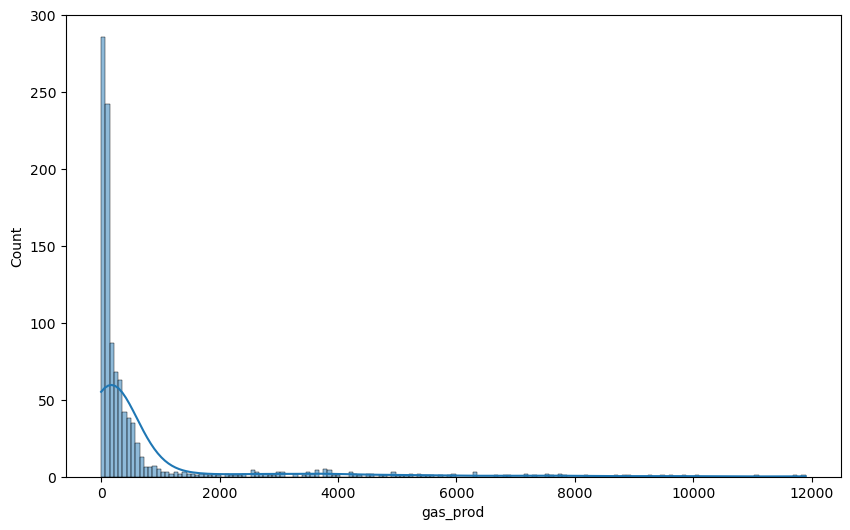

In [44]:
plt.figure(figsize= (10 , 6))
g = sns.histplot(gvf_grp2['gas_prod'] , kde = True)

In [45]:
print('SalePrice Skewness is = ' , gvf_grp2['gas_prod'].skew())
print("Kurtosis: %f" % gvf_grp2['gas_prod'].kurt())

SalePrice Skewness is =  3.696167279557049
Kurtosis: 14.948387


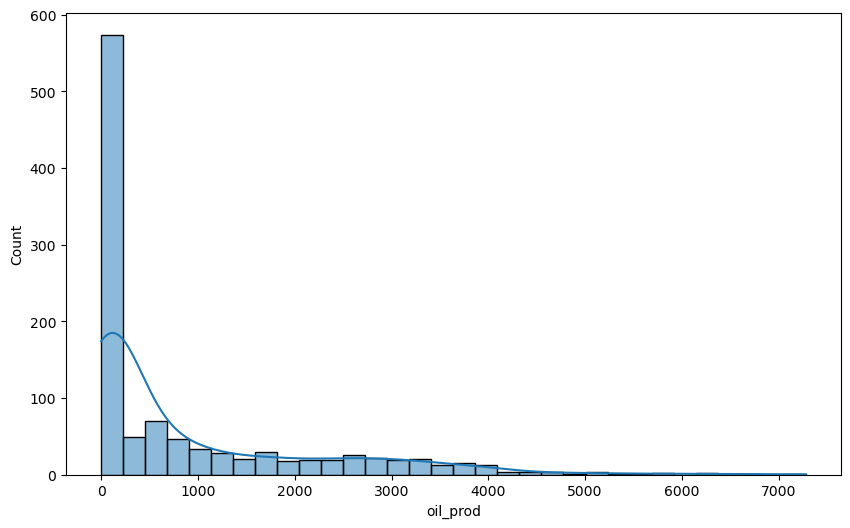

In [46]:
plt.figure(figsize= (10 , 6))
g = sns.histplot(gvf_grp2['oil_prod'] , kde = True)

In [47]:
print('SalePrice Skewness is = ' , gvf_grp2['oil_prod'].skew())
print("Kurtosis: %f" % gvf_grp2['oil_prod'].kurt())

SalePrice Skewness is =  1.7417722812059442
Kurtosis: 2.683376


##  Discovring Categorical data 

In [48]:
features = [i for i in df_vac.columns if df_vac[i].dtype == 'O' ]
df_vac[features]


,company_name,company_id,well_name,formation,basin,ressource_type,classification,extraction_type
8183,YPF S.A.,YPF,YPF.Nq.LLL-479,vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLOTACION,Surgencia Natural
8226,YPF S.A.,YPF,YPF.Nq.LLL-479,vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLOTACION,Surgencia Natural
8228,YPF S.A.,YPF,YPF.Nq.LLL.x-475,vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLORACION,Surgencia Natural
8229,YPF S.A.,YPF,YPF.Nq.SOil.x-1,vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLORACION,Surgencia Natural
8230,YPF S.A.,YPF,YPF.Nq.LLL.x-485,vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLORACION,Surgencia Natural
...,...,...,...,...,...,...,...,...
136332,YPF S.A.,YPF,YPF.Nq.EOr-105(h),vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLOTACION,Surgencia Natural
136333,YPF S.A.,YPF,YPF.Nq.EOr-104(h),vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLOTACION,Surgencia Natural
136336,YPF S.A.,YPF,YPF.Nq.LLL-1444(h),vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLOTACION,Bombeo Mecánico
136338,YPF S.A.,YPF,YPF.Nq.LCav-12(h),vaca muerta,NEUQUINA,NO CONVENCIONAL,EXPLOTACION,Bombeo Mecánico


## Well production  

In [49]:
df_company = df_vac[['well_name' ,'gas_prod','oil_prod', 'water_prod']]
comany_prod = df_company.groupby(['well_name' ]).agg('sum')
comany_prod1 = comany_prod.sort_values(by = 'gas_prod' , ascending = False )
comany_prod2 =  comany_prod.sort_values(by = 'oil_prod' , ascending = False )
comany_prod3 =  comany_prod.sort_values(by = 'water_prod' , ascending = False )

comany_prod2.head()

,gas_prod,oil_prod,water_prod
well_name,,,
YPF.Nq.LLL-1572(h),34473.03,145642.14,10616.52
YPF.Nq.SOil-373(h),13090.23,144705.45,19237.81
YPF.Nq.LLL-1577(h),23117.64,144324.15,12580.13
YPF.Nq.LLL-1576(h),22422.83,142109.57,15457.13
YPF.Nq.LLL-1567(h),26122.61,131138.52,12367.66


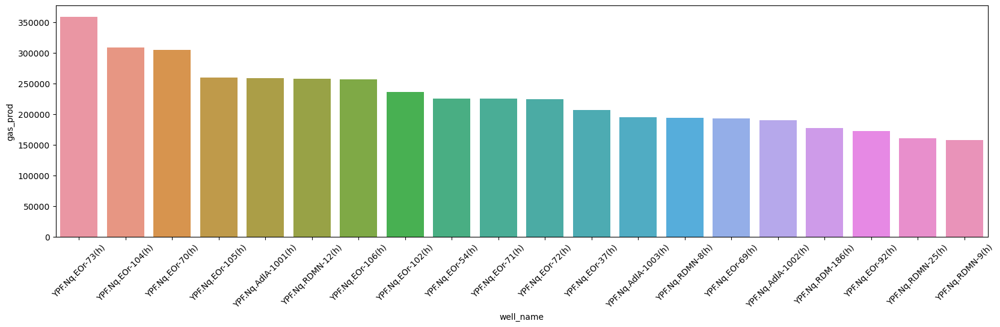

In [50]:
plt.figure(figsize = (20,5))
plt.xticks(rotation='45')
ax = sns.barplot(x = comany_prod1.head(20).index , y =comany_prod1['gas_prod'].head(20)  )

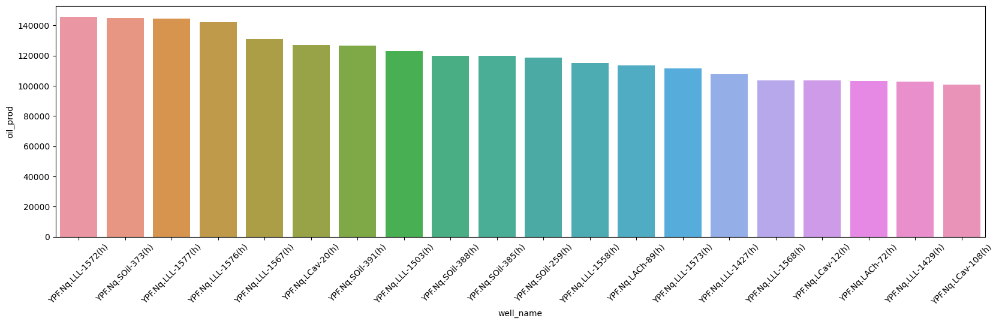

In [51]:
plt.figure(figsize = (20,5))
plt.xticks(rotation='45')
ax = sns.barplot(x = comany_prod2.head(20).index , y =comany_prod2['oil_prod'].head(20)  )

(-1.1070287892385353,
 1.1077614281651962,
 -1.1080745934537521,
 1.1003845044501788)

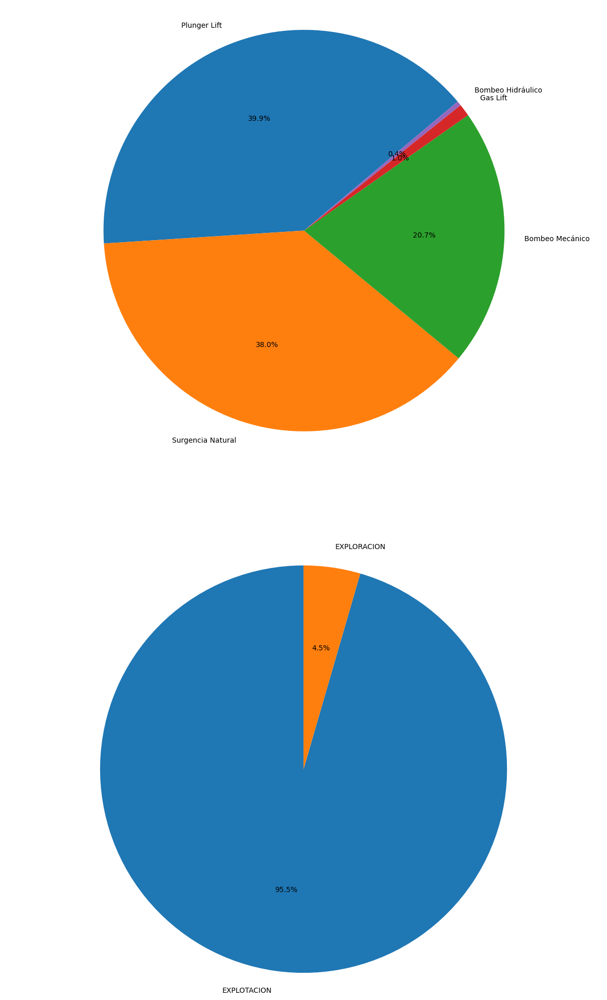

In [52]:

a = np.array(df_vac['extraction_type'].value_counts().sort_values(ascending=False).head(5))
b = np.array(df_vac['classification'].value_counts().sort_values(ascending=False).head(2))
labels_a = [i for i in df_vac['extraction_type'].value_counts().sort_values(ascending=False).head(5).index ]
labels_b = [j for j in df_vac['classification'].value_counts().sort_values(ascending=False).head(2).index ]

# Pie chart, where the slices will be ordered and plotted counter-clockwise:

fig1, (ax1 ,ax2) = plt.subplots(2,1 , figsize= (15,25))
ax1.pie(a, labels=labels_a, autopct='%1.1f%%',
         startangle=40)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

ax2.pie(b, labels=labels_b, autopct='%1.1f%%',
         startangle=90)
ax2.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.


In [53]:
df_vac['extraction_type'].value_counts().sort_values(ascending=False)

Plunger Lift         23866
Surgencia Natural    22718
Bombeo Mecánico      12398
Gas Lift               594
Bombeo Hidráulico      219
Jet Pump                 1
Electrosumergible        1
Name: extraction_type, dtype: int64

###  Extraction type Production 

In [54]:
df_company = df_vac[['extraction_type' ,'month','gas_prod','oil_prod', 'water_prod','GVF%','GOR%','GLR']]
comany_prod = df_company.groupby(['extraction_type','month']).agg('mean')
comany_prod1 = comany_prod.sort_values(by = 'GVF%' , ascending = False )
comany_prod2 =  comany_prod.sort_values(by = 'GOR%' , ascending = False )
comany_prod3 =  comany_prod.sort_values(by = 'GLR' , ascending = False )

comany_prod2

gas_prod    oil_prod  water_prod       GVF%  \
extraction_type   month                                                 
Plunger Lift      10     60.733821   77.240634   36.039619  38.861353   
                  9      58.197330   74.142756   35.529206  38.123405   
                  2      54.869975   65.984279   30.589446  38.704079   
                  1      57.792495   71.378893   25.807102  39.076816   
                  6      55.242122   70.109020   28.864927  38.732420   
...                            ...         ...         ...        ...   
Bombeo Hidráulico 12     85.466250  478.756250   23.293125  12.463750   
                  10     64.084211  424.390526   90.586316  11.524211   
                  2      70.632632  348.923684   22.377368  12.192105   
                  1      67.035556  458.137222   22.524444  11.375556   
Electrosumergible 5       3.160000   93.340000    0.000000   3.270000   

                              GOR%       GLR  
extraction_type   month                       
Plunger Lift      10     49.056031  1.055159  
                  9      48.354038  0.988617  
                  2      47.759231  1.007484  
                  1      47.363628  1.025153  
                  6      47.233327  0.918546  
...                            ...       ...  
Bombeo Hidráulico 12     13.014375  0.145625  
                  10     12.905789  0.133158  
                  2      12.873684  0.147368  
                  1      11.864444  0.133333  
Electrosumergible 5       3.270000  0.030000  

[62 rows x 6 columns]

Text(0.5, 1.0, 'GVF by production type ')

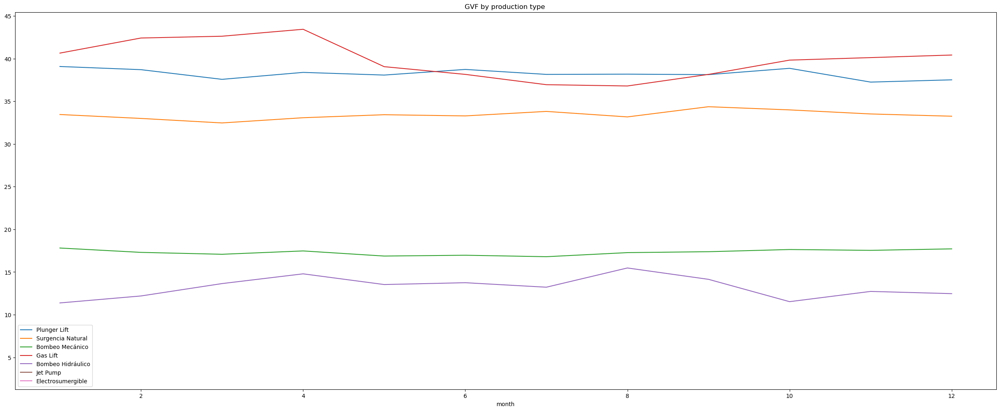

In [55]:
c= df_vac[df_vac['extraction_type']=="Sin Sistema de Extracción"].groupby('month').mean()
d = df_vac[df_vac['extraction_type']=="Bombeo Hidráulico"].groupby('month').mean()

fig,ax1 = plt.subplots(figsize=(31,12))

for i in df_vac['extraction_type'].value_counts().sort_values(ascending=False).index:
    c= df_vac[df_vac['extraction_type']== i ].groupby('month').mean()
    ax1 = c["GVF%"].plot(ax=ax1 , label =i)
    ax1.legend()


ax1.set_title('GVF by production type ')

In [110]:
import io
import folium
import folium.plugins 
boston_map=folium.Map([df_vac['longitude'].mean(), df_vac['latitude'].mean()],zoom_start=12)
incidents2= folium.plugins.MarkerCluster().add_to(boston_map)
for Latitude,Longitude,Employees in zip(df_vac.latitude,df_vac.longitude,df_vac["GVF%"]):
    folium.Marker(location=[Latitude,Longitude],icon=None,popup=Employees).add_to(incidents2)

boston_map.add_child(incidents2)

boston_map


KeyboardInterrupt: 

###  Let's interest about well with high GVF

In [ ]:
# draw boxplots to visualize outliers
df_highgvf = df_vac[df_vac["GVF%"]>=50]

plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = df_highgvf.boxplot(column='latitude')
fig.set_title('')
fig.set_ylabel('latitude')


plt.subplot(2, 2, 2)
fig = df_highgvf.boxplot(column='longitude')
fig.set_title('')
fig.set_ylabel('longitude')



In [ ]:
df_highgvf.shape

In [ ]:
df_highgvf = df_highgvf.drop(df_highgvf['latitude'][(df_highgvf['latitude']>-37.5)|(df_highgvf['latitude']<-38.75)].index)

In [ ]:
df_highgvf.shape

In [ ]:
hi = df_vac[df_vac["GVF%"]>=80]
ho = df_vac[df_vac["GOR%"]>=80]

In [ ]:
import io
import folium
import folium.plugins 
boston_map=folium.Map([df_highgvf['longitude'].mean(), df_highgvf['latitude'].mean()],zoom_start=12)
incidents2= folium.plugins.MarkerCluster().add_to(boston_map)
for Latitude,Longitude,Employees in zip(df_highgvf.latitude,df_highgvf.longitude,df_highgvf["GVF%"]):
    folium.Marker(location=[Latitude,Longitude],icon=None,popup=Employees).add_to(incidents2)

boston_map.add_child(incidents2)

boston_map


# Machine learning 

we want to predict GAZ , OIl production than GVF and GOR 
Features are : 'month','puit_id','waterinj' ,'gasinj' ,'effective_time','depth','longitude' ,'latitude' ,'comapny_id' , 'extraction_type' , 'champ' , 'bassin' , 'class' , 'dates'

In [107]:
df_vac = df_highgvf
X = df_vac[['day','month','well_id','effective_time','depth','longitude' ,'latitude' , 'extraction_type' , 'classification' ]]
X.head()

,day,month,well_id,effective_time,depth,longitude,latitude,extraction_type,classification
8231,31,1,135925,20.50,3150.0,-68.6310,-38.4113,Gas Lift,EXPLOTACION
8287,31,1,135925,31.00,3150.0,-68.6310,-38.4113,Gas Lift,EXPLOTACION
8374,31,1,135925,31.00,3150.0,-68.6310,-38.4113,Gas Lift,EXPLOTACION
8388,31,1,136725,31.00,2704.0,-68.8690,-38.3095,Surgencia Natural,EXPLOTACION
8440,31,1,137238,30.04,2686.0,-68.8883,-38.3191,Surgencia Natural,EXPLOTACION


In [ ]:
df_vac.describe()

In [ ]:
df_vac.classification.value_counts()

## Categrical Encoding 

In [ ]:
categorical =[i for i in X.columns if X[i].dtype == 'O']

extraction_type = [i for i in range(0,X['extraction_type'].nunique())]

coll =  [extraction_type , [0,1]]
for j, i in zip(categorical , coll):
       X[j] = X[j].replace(X[j].unique() , i  ).copy()
        

In [ ]:

dictio2 = {    
    'extraction_type': df_vac['extraction_type'].unique(),
    'extraction_type_encoded':[i for i in range(0,df_vac['extraction_type'].nunique())]
}


dictio3 = {
    'class' : df_vac['classification'].unique(),
    'class_encoded' :[0,1]
}


for j in [dictio2,dictio3]:
      print(pd.DataFrame(j))
      print('---------------------------')
     

In [ ]:
def target(i):
    Y = np.array(df_vac[i])
    return Y 

X = np.array(X)
#x = x.toarray()

##  Train test split 

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor

y_gaz = target('gas_prod')
y_water = target('water_prod')
y_oil =  target('oil_prod')
y_gvf = target('GVF%')
y_gor = target('GOR%')

def split(X,Y):
# train test split
    x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.3,random_state = 1)
    x_validation = x_train[round(0.7*x_train.shape[0]):]
    y_validation = y_train[round(0.7*y_train.shape[0]):]
    x_train = x_train[0:round(0.7*x_train.shape[0])]
    y_train = y_train[0:round(0.7*y_train.shape[0])]
    return x_train,x_test,y_train,y_test,x_validation,y_validation 
    
  

##  Predicting For GVF

In [ ]:
x_train,x_test,y_train,y_test,x_validation,y_validation = split(X,y_gvf)
print(x_train.shape ,   y_train.shape)
print(x_test.shape ,   y_test.shape)
print(x_validation.shape ,   y_validation.shape)



## Standard Scaling 

In [ ]:
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR


from sklearn.model_selection import GridSearchCV , learning_curve
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

## Tree based models 

###  CatBoost 

In [ ]:
cat_scaler = MinMaxScaler()
cat_scaler.fit(x_train)
cat_train = cat_scaler.transform(x_train)
cat_val = cat_scaler.transform(x_validation)
cat_test = cat_scaler.transform(x_test)

In [170]:
cat_features = [0, 1, 7, 8]

catboost_model = CatBoostRegressor(
    iterations=500,
    max_ctr_complexity=4,
    random_seed=0,
    od_type='Iter',
    od_wait=25,
    verbose=50,
    depth=4
)

catboost_model.fit(cat_train, y_train,
    
    eval_set=(cat_val, y_validation)
)

Learning rate set to 0.102836
0:	learn: 15.2770510	test: 15.1723908	best: 15.1723908 (0)	total: 6.63ms	remaining: 3.31s
50:	learn: 10.4921885	test: 10.4199590	best: 10.4199590 (50)	total: 89.3ms	remaining: 786ms
100:	learn: 10.0642107	test: 10.1082479	best: 10.1082479 (100)	total: 162ms	remaining: 640ms
150:	learn: 9.7459886	test: 9.8668174	best: 9.8665574 (149)	total: 230ms	remaining: 531ms
200:	learn: 9.5348092	test: 9.7426096	best: 9.7419706 (199)	total: 298ms	remaining: 443ms
250:	learn: 9.3658843	test: 9.6559611	best: 9.6559611 (250)	total: 366ms	remaining: 363ms
300:	learn: 9.2277946	test: 9.6069134	best: 9.6060717 (298)	total: 442ms	remaining: 292ms
350:	learn: 9.1004048	test: 9.5585151	best: 9.5585151 (350)	total: 516ms	remaining: 219ms
400:	learn: 8.9953061	test: 9.5260839	best: 9.5251473 (395)	total: 594ms	remaining: 147ms
450:	learn: 8.8910604	test: 9.5000788	best: 9.4989604 (448)	total: 666ms	remaining: 72.4ms
499:	learn: 8.8044020	test: 9.4829045	best: 9.4829045 (499)	tota

In [171]:
print('Model params:', catboost_model.get_params())

Model params: {'iterations': 500, 'depth': 4, 'loss_function': 'RMSE', 'od_wait': 25, 'od_type': 'Iter', 'random_seed': 0, 'verbose': 50, 'max_ctr_complexity': 4}


In [175]:
catboost_train_pred = catboost_model.predict(cat_train)
catboost_val_pred = catboost_model.predict(cat_val)
catboost_test_pred = catboost_model.predict(cat_test)

In [176]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, catboost_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, catboost_val_pred)))

Train rmse: 8.804401929377539
Validation rmse: 9.482904533728682


In [177]:
print(f"train score of : {catboost_model.score(cat_train, y_train)}  ,  test score of  : {catboost_model.score(cat_test, y_test)} ") 

train score of : 0.7005181586308331  ,  test score of  : 0.6574640190008194 


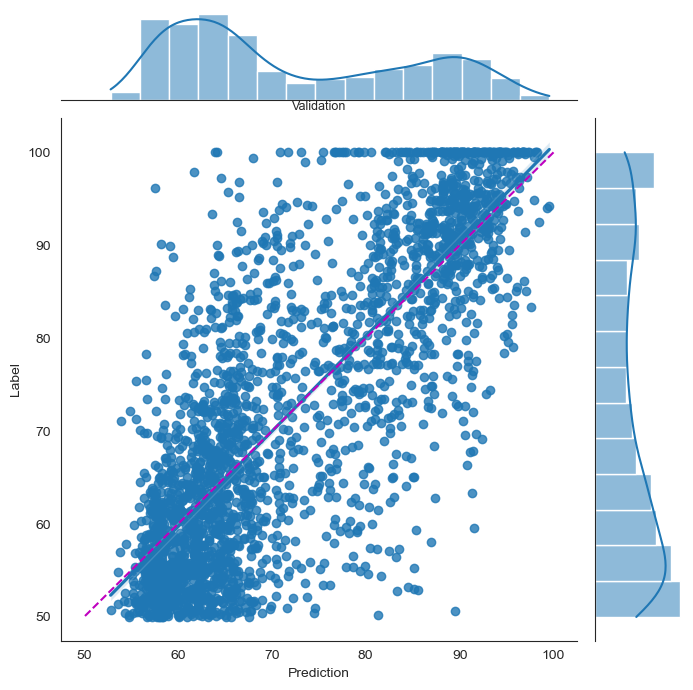

In [178]:
def model_performance_sc_plot(predictions, labels, title):
    # Get min and max values of the predictions and labels.
    min_val = max(max(predictions), max(labels))
    max_val = min(min(predictions), min(labels))
    # Create dataframe with predicitons and labels.
    performance_df = pd.DataFrame({"Label":labels})
    performance_df["Prediction"] = predictions
    # Plot data
    sns.jointplot(y="Label", x="Prediction", data=performance_df, kind="reg", height=7)
    plt.plot([min_val, max_val], [min_val, max_val], 'm--')
    plt.title(title, fontsize=9)
    plt.show()
    
# model_performance_sc_plot(catboost_train_pred, Y_train, 'Train')
model_performance_sc_plot(catboost_val_pred, y_validation, 'Validation')

### XGBoost 

In [179]:
xgb_model = XGBRegressor(max_depth=8, 
                         n_estimators=500, 
                         min_child_weight=1000,  
                         colsample_bytree=0.7, 
                         subsample=0.7, 
                         eta=0.3, 
                         seed=0)
xgb_model.fit(cat_train, 
              y_train, 
              eval_metric="rmse", 
              eval_set=[(cat_train, y_train), (cat_val, y_validation)], 
              verbose=20, 
              early_stopping_rounds=20)

[0]	validation_0-rmse:52.09521	validation_1-rmse:52.09838
[20]	validation_0-rmse:11.13234	validation_1-rmse:10.95058
[40]	validation_0-rmse:11.01606	validation_1-rmse:10.88609
[60]	validation_0-rmse:10.94279	validation_1-rmse:10.79509
[80]	validation_0-rmse:10.86572	validation_1-rmse:10.75410
[100]	validation_0-rmse:10.80503	validation_1-rmse:10.70765
[120]	validation_0-rmse:10.75793	validation_1-rmse:10.66054
[140]	validation_0-rmse:10.70228	validation_1-rmse:10.60538
[160]	validation_0-rmse:10.64090	validation_1-rmse:10.53649
[180]	validation_0-rmse:10.58315	validation_1-rmse:10.49971
[200]	validation_0-rmse:10.53989	validation_1-rmse:10.44481
[220]	validation_0-rmse:10.49838	validation_1-rmse:10.40806
[240]	validation_0-rmse:10.46319	validation_1-rmse:10.38331
[260]	validation_0-rmse:10.42745	validation_1-rmse:10.36214
[280]	validation_0-rmse:10.40465	validation_1-rmse:10.32905
[300]	validation_0-rmse:10.37802	validation_1-rmse:10.31306
[320]	validation_0-rmse:10.34826	validation_1-

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, enable_categorical=False,
             eta=0.3, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=8, min_child_weight=1000, missing=nan,
             monotone_constraints='()', n_estimators=500, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=0, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=None)

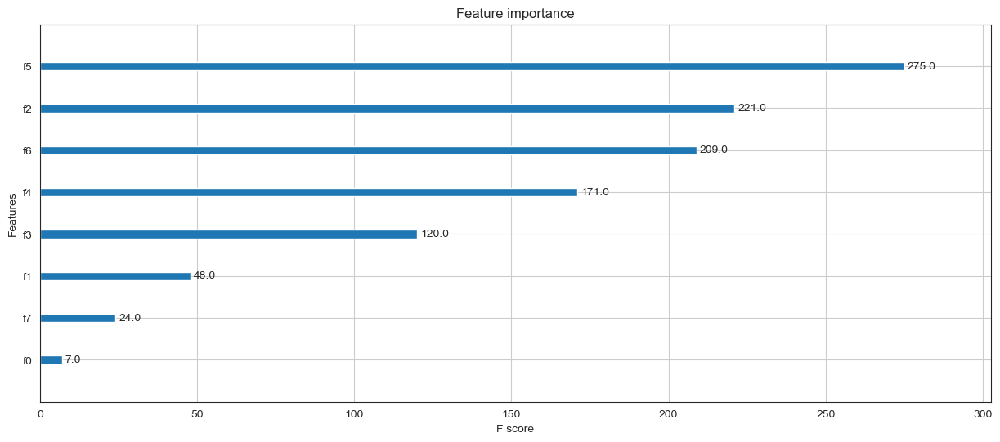

In [180]:
plt.rcParams["figure.figsize"] = (15, 6)
plot_importance(xgb_model)
plt.show()

In [182]:
xgb_train_pred = xgb_model.predict(cat_train)
xgb_val_pred = xgb_model.predict(cat_val)
xgb_test_pred = xgb_model.predict(cat_test)

In [183]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, xgb_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, xgb_val_pred)))

Train rmse: 10.151257214061765
Validation rmse: 10.119709146664325


In [184]:
print(f"train score of : {xgb_model.score(cat_train, y_train)}  ,  test score of  : {xgb_model.score(cat_test, y_test)} ") 

train score of : 0.6018832606943395  ,  test score of  : 0.6069557883320233 


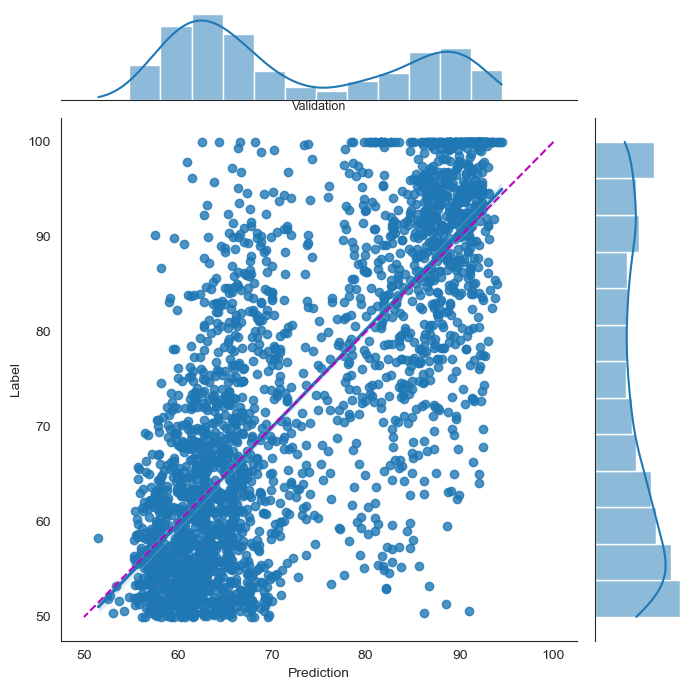

In [185]:
# model_performance_sc_plot(xgb_train_pred, Y_train, 'Train')
model_performance_sc_plot(xgb_val_pred, y_validation, 'Validation')

###  Random Forest 

In [186]:
rf_model = RandomForestRegressor(n_estimators=50, max_depth=7, random_state=0, n_jobs=-1)
rf_model.fit(cat_train, y_train)

RandomForestRegressor(max_depth=7, n_estimators=50, n_jobs=-1, random_state=0)

In [188]:
rf_train_pred = rf_model.predict(cat_train)
rf_val_pred = rf_model.predict(cat_val)
rf_test_pred = rf_model.predict(cat_test)

In [189]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, rf_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, rf_val_pred)))

Train rmse: 9.410701822605484
Validation rmse: 9.76101016069176


In [190]:
print(f"train score of : {rf_model.score(cat_train, y_train)}  ,  test score of  : {rf_model.score(cat_test, y_test)} ") 

train score of : 0.6578513740453305  ,  test score of  : 0.6345163768363798 


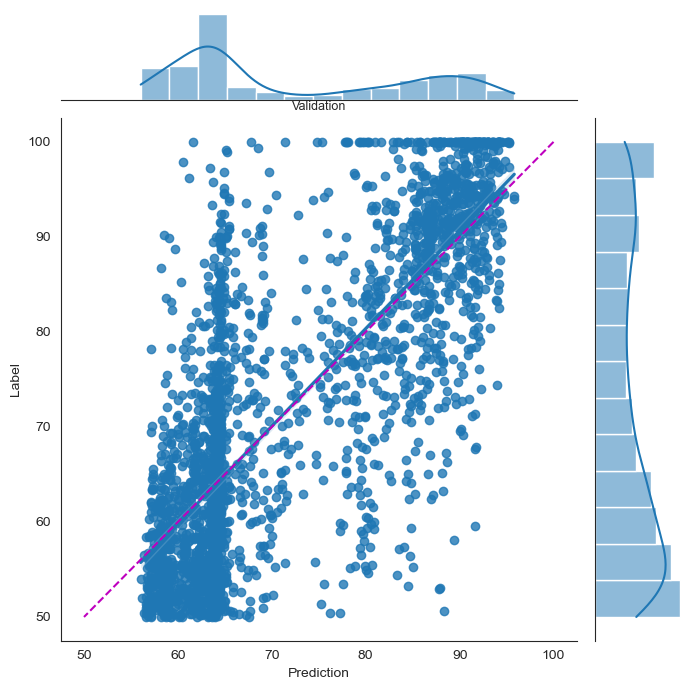

In [191]:
# model_performance_sc_plot(rf_train_pred, Y_train, 'Train')
model_performance_sc_plot(rf_val_pred, y_validation, 'Validation')

##  Linear Models 

#### Normalising data 

In [132]:
lr_scaler = MinMaxScaler()
lr_scaler.fit(x_train)
lr_train = lr_scaler.transform(x_train)
lr_val = lr_scaler.transform(x_validation)
lr_test = lr_scaler.transform(x_test)

In [133]:
lr_model = LinearRegression(n_jobs=-1)
lr_model.fit(lr_train, y_train)

LinearRegression(n_jobs=-1)

In [134]:
lr_train_pred = lr_model.predict(lr_train)
lr_val_pred = lr_model.predict(lr_val)
lr_test_pred = lr_model.predict(lr_test)

In [ ]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, lr_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, lr_val_pred)))

In [135]:
print(f"train score of : {lr_model.score(lr_train, y_train)}  ,  test score of  : {lr_model.score(lr_test, y_test)} ") 

train score of : 0.46156384569397313  ,  test score of  : 0.4854448106221507 


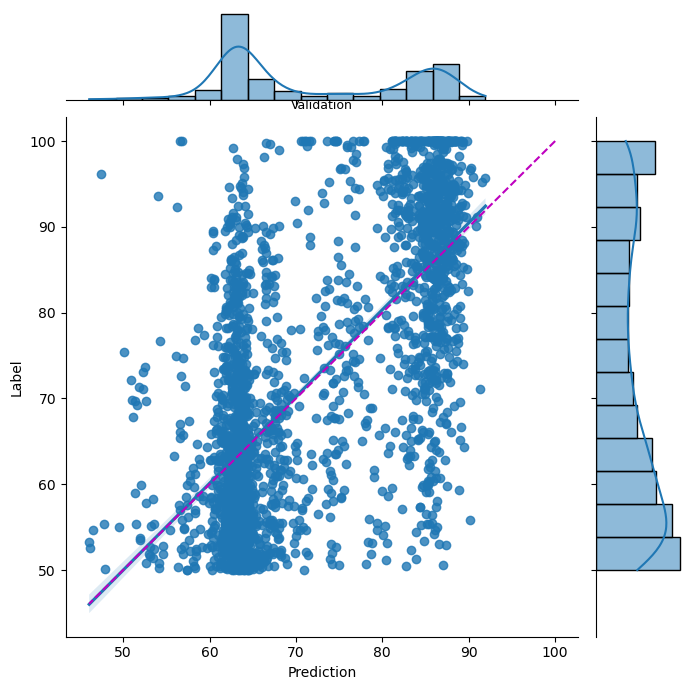

In [136]:
# model_performance_sc_plot(lr_train_pred, Y_train, 'Train')
model_performance_sc_plot(lr_val_pred, y_validation, 'Validation')

## Clusterning Models 

###  KNN Regressor 

####  Normalising Features 

In [137]:
knn_scaler = MinMaxScaler()
knn_scaler.fit(x_train)
knn_train = knn_scaler.transform(x_train)
knn_val = knn_scaler.transform(x_validation)
knn_test = knn_scaler.transform(x_test)

In [138]:
knn_model = KNeighborsRegressor(n_neighbors=9, leaf_size=13, n_jobs=-1)
knn_model.fit(knn_train, y_train)

KNeighborsRegressor(leaf_size=13, n_jobs=-1, n_neighbors=9)

In [139]:
knn_train_pred = knn_model.predict(lr_train)
knn_val_pred = knn_model.predict(lr_val)
knn_test_pred = knn_model.predict(lr_test)

In [140]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, knn_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, knn_val_pred)))

Train rmse: 10.112913853255245
Validation rmse: 11.124218372562316


In [141]:
print(f"train score of : {knn_model.score(knn_train, y_train)}  ,  test score of  : {knn_model.score(knn_test, y_test)} ") 

train score of : 0.6048851162677455  ,  test score of  : 0.5256261115971381 


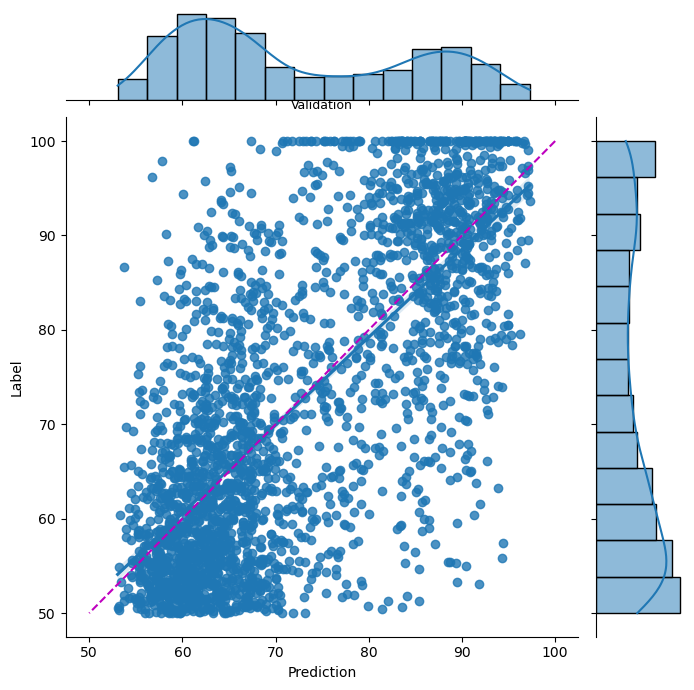

In [142]:
# model_performance_sc_plot(knn_train_pred, Y_train_sampled, 'Train')
model_performance_sc_plot(knn_val_pred, y_validation, 'Validation')

 ### Ridge Regressor


In [143]:
ridge_scaler = MinMaxScaler()
ridge_scaler.fit(x_train)
ridge_train = ridge_scaler.transform(x_train)
ridge_val = ridge_scaler.transform(x_validation)
ridge_test = ridge_scaler.transform(x_test)

In [144]:
# Ridge Regressor
ridge_alphas = [1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100]
ridge =  RidgeCV(alphas=ridge_alphas)
ridge.fit(ridge_train , y_train)

RidgeCV(alphas=[1e-15, 1e-10, 1e-08, 0.0009, 0.0007, 0.0005, 0.0003, 0.0001,
                0.001, 0.05, 0.01, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50,
                75, 100])

In [145]:
ridge_train_pred = ridge.predict(ridge_train)
ridge_val_pred = ridge.predict(ridge_val)
ridge_test_pred = ridge.predict(ridge_test)

In [146]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, ridge_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, ridge_val_pred)))

Train rmse: 11.805454714778048
Validation rmse: 11.65963346310169


In [147]:
print(f"train score of : {ridge.score(ridge_train, y_train)}  ,  test score of  : {ridge.score(ridge_test, y_test)} ") 

train score of : 0.4615613665349426  ,  test score of  : 0.485461489489474 


### Light Gradient Boosting Regressor

In [195]:
# Light Gradient Boosting Regressor
lightgbm = LGBMRegressor(objective='regression', verbose=1,random_state=42)
lightgbm.fit(cat_train , y_train)


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1250
[LightGBM] [Info] Number of data points in the train set: 5952, number of used features: 9
[LightGBM] [Info] Start training from score 72.090158


LGBMRegressor(objective='regression', random_state=42, verbose=1)

In [196]:
lightgbm_train_pred = lightgbm.predict(cat_train)
lightgbm_val_pred = lightgbm.predict(cat_val)
lightgbm_test_pred = lightgbm.predict(cat_test)

In [197]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, lightgbm_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, lightgbm_val_pred)))

Train rmse: 8.34515784883738
Validation rmse: 9.481964600969473


In [198]:
print(f"train score of : {lightgbm.score(cat_train, y_train)}  ,  test score of  : {lightgbm.score(cat_test, y_test)} ") 

train score of : 0.730945731955168  ,  test score of  : 0.6588191965645268 


###  Gradient boosting Regressor 

In [199]:
# Gradient Boosting Regressor
gbr = GradientBoostingRegressor(loss='huber',random_state=42)  
gbr.fit(cat_train , y_train)

GradientBoostingRegressor(loss='huber', random_state=42)

In [201]:
gbr_train_pred = gbr.predict(cat_train)
gbr_val_pred = gbr.predict(cat_val)
gbr_test_pred = gbr.predict(cat_test)

In [202]:
print('Train rmse:', np.sqrt(mean_squared_error(y_train, gbr_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(y_validation, gbr_val_pred)))

Train rmse: 9.840423360616683
Validation rmse: 9.963662941339708


In [203]:
print(f"train score of : {gbr.score(cat_train, y_train)}  ,  test score of  : {gbr.score(cat_test, y_test)} ") 

train score of : 0.6258908410220547  ,  test score of  : 0.6194028270626987 


# DEEP NEURAL NETWORK

In [156]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

assert hasattr(tf, "function") # Be sure to use tensorflow 2.0

In [157]:
x_train,x_test,y_train,y_test = train_test_split(X,y_gvf,test_size = 0.3,random_state = 1)
dl_train = knn_scaler.transform(x_train)
dl_test = knn_scaler.transform(x_test)


###  LOSS Tracking

In [158]:
def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

###  Building Model

In [159]:


tf.random.set_seed(42)

model = Sequential([
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(1)
])

model.compile(
    loss=rmse,
    optimizer=Adam(),
    metrics=[rmse]
)

model.fit(dl_train, y_train, epochs=100)

Epoch 1/100
266/266 [==============================] - 3s 2ms/step - loss: 19.5797 - rmse: 19.5748
Epoch 2/100
266/266 [==============================] - 0s 2ms/step - loss: 12.2889 - rmse: 12.2921
Epoch 3/100
266/266 [==============================] - 0s 2ms/step - loss: 11.8329 - rmse: 11.8317
Epoch 4/100
266/266 [==============================] - 0s 2ms/step - loss: 11.6324 - rmse: 11.6299
Epoch 5/100
266/266 [==============================] - 1s 2ms/step - loss: 11.5661 - rmse: 11.5637
Epoch 6/100
266/266 [==============================] - 0s 2ms/step - loss: 11.5134 - rmse: 11.5148
Epoch 7/100
266/266 [==============================] - 0s 2ms/step - loss: 11.4697 - rmse: 11.4679
Epoch 8/100
266/266 [==============================] - 0s 2ms/step - loss: 11.4403 - rmse: 11.4434
Epoch 9/100
266/266 [==============================] - 0s 2ms/step - loss: 11.5810 - rmse: 11.5793
Epoch 10/100
266/266 [==============================] - 0s 2ms/step - loss: 11.4775 - rmse: 11.4804
Epoch 11/

266/266 [==============================] - 1s 2ms/step - loss: 10.6368 - rmse: 10.6351
Epoch 84/100
266/266 [==============================] - 1s 2ms/step - loss: 10.6520 - rmse: 10.6493
Epoch 85/100
266/266 [==============================] - 1s 2ms/step - loss: 10.5836 - rmse: 10.5834
Epoch 86/100
266/266 [==============================] - 1s 2ms/step - loss: 10.6070 - rmse: 10.6054
Epoch 87/100
266/266 [==============================] - 1s 2ms/step - loss: 10.6159 - rmse: 10.6151
Epoch 88/100
266/266 [==============================] - 1s 2ms/step - loss: 10.6017 - rmse: 10.6015
Epoch 89/100
266/266 [==============================] - 1s 2ms/step - loss: 10.5783 - rmse: 10.5798
Epoch 90/100
266/266 [==============================] - 1s 2ms/step - loss: 10.5583 - rmse: 10.5576
Epoch 91/100
266/266 [==============================] - 1s 2ms/step - loss: 10.5582 - rmse: 10.5566
Epoch 92/100
266/266 [==============================] - 1s 3ms/step - loss: 10.5414 - rmse: 10.5411: 0s - loss: 1

###  Making predictions 

In [160]:
predictions = model.predict(dl_test)
predictions[:5]

array([[81.89977 ],
       [59.609562],
       [60.573917],
       [58.666763],
       [60.601566]], dtype=float32)

In [161]:
predictions = np.ravel(predictions)
predictions[:5]

array([81.89977 , 59.609562, 60.573917, 58.666763, 60.601566],
      dtype=float32)

###  model evaluation

In [162]:
rmse(y_test, predictions).numpy()

10.637985476953885

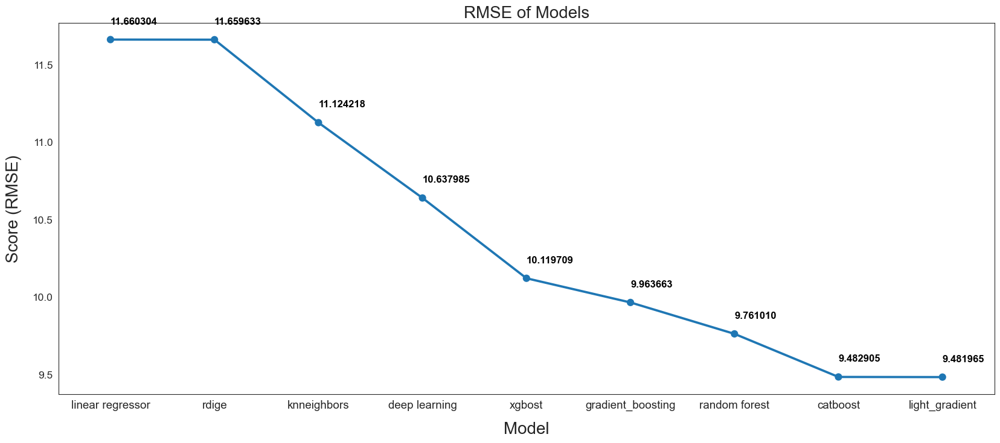

In [218]:
# Plot the predictions for each model
sns.set_style("white")
fig = plt.figure(figsize=(20, 8))
scores_keys = ['linear regressor' , 'rdige','knneighbors','deep learning' , 'xgbost'  ,'gradient_boosting','random forest' ,'catboost','light_gradient' ]
scores_values = [np.sqrt(mean_squared_error(y_validation, lr_val_pred)), 
                 np.sqrt(mean_squared_error(y_validation, ridge_val_pred)) ,
                 np.sqrt(mean_squared_error(y_validation, knn_val_pred)) ,
                  rmse(y_test, predictions).numpy() ,
                 np.sqrt(mean_squared_error(y_validation, xgb_val_pred)), np.sqrt(mean_squared_error(y_validation, gbr_val_pred)),
                   np.sqrt(mean_squared_error(y_validation, rf_val_pred)) ,  
         
              
                    np.sqrt(mean_squared_error(y_validation, catboost_val_pred)) , 
                np.sqrt(mean_squared_error(y_validation, lightgbm_val_pred)) ] 


ax = sns.pointplot(x=list(scores_keys), y=[score for score in scores_values], markers=['o'], linestyles=['-'])

for i, score in enumerate(scores_values):
    ax.text(i, score + 0.100, '{:.6f}'.format(score), horizontalalignment='left', size='large', color='black', weight='semibold')
    
plt.ylabel('Score (RMSE)', size=20, labelpad=12.5)
plt.xlabel('Model', size=20, labelpad=12.5)
plt.tick_params(axis='x', labelsize=13.5)
plt.tick_params(axis='y', labelsize=12.5)

plt.title('RMSE of Models', size=20)

plt.show()

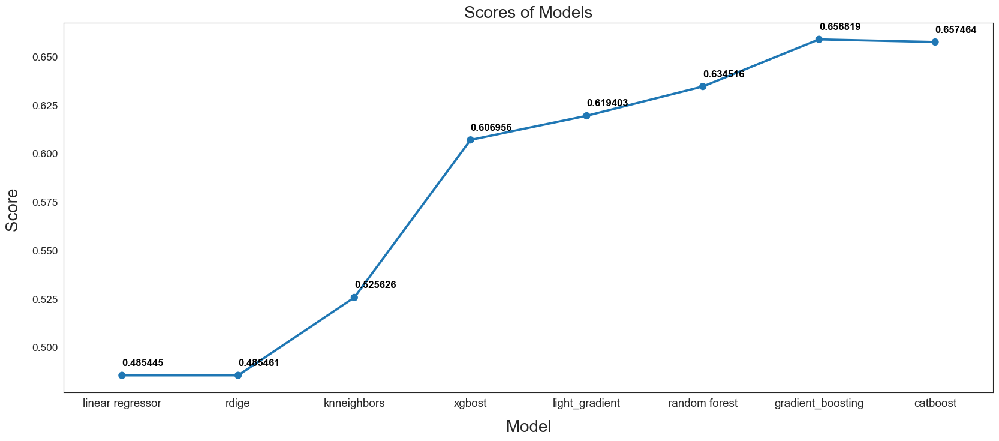

In [214]:
# Plot the predictions for each model
sns.set_style("white")
fig = plt.figure(figsize=(20, 8))
scores_keys = ['linear regressor' , 'rdige','knneighbors', 'xgbost'  ,'light_gradient','random forest'  ,'gradient_boosting' , 'catboost' ]
scores_values = [lr_model.score(lr_test, y_test) , ridge.score(ridge_test, y_test) ,knn_model.score(knn_test, y_test),
                  xgb_model.score(cat_test, y_test),
                 gbr.score(cat_test, y_test) , 
                rf_model.score(cat_test, y_test),
               lightgbm.score(cat_test, y_test) ,
               
     catboost_model.score(cat_test, y_test) ]

ax = sns.pointplot(x=list(scores_keys), y=[score for score in scores_values], markers=['o'], linestyles=['-'])

for i, score in enumerate(scores_values):
    ax.text(i, score + 0.005, '{:.6f}'.format(score), horizontalalignment='left', size='large', color='black', weight='semibold')
    
plt.ylabel('Score ', size=20, labelpad=12.5)
plt.xlabel('Model', size=20, labelpad=12.5)
plt.tick_params(axis='x', labelsize=13.5)
plt.tick_params(axis='y', labelsize=12.5)

plt.title('Scores of Models', size=20)

plt.show()